## Reference: https://archive.ics.uci.edu/ml/datasets/Wine+Quality

In [1]:
using CSV, DataFrames, GLM, RegressionTables, Plots, Gadfly, BoxCoxTrans, Statistics

In [2]:
data = CSV.read("winequality-red.csv", DataFrame);

In [3]:
names(data)

12-element Vector{String}:
 "fixed acidity"
 "volatile acidity"
 "citric acid"
 "residual sugar"
 "chlorides"
 "free sulfur dioxide"
 "total sulfur dioxide"
 "density"
 "pH"
 "sulphates"
 "alcohol"
 "quality"

In [4]:
sz = size(data)

(1599, 12)

In [5]:
describe(data)

,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Real,Float64,Real,Int64,DataType
1,fixed acidity,8.31964,4.6,7.9,15.9,0,Float64
2,volatile acidity,0.527821,0.12,0.52,1.58,0,Float64
3,citric acid,0.270976,0.0,0.26,1.0,0,Float64
4,residual sugar,2.53881,0.9,2.2,15.5,0,Float64
5,chlorides,0.0874665,0.012,0.079,0.611,0,Float64
6,free sulfur dioxide,15.8749,1.0,14.0,72.0,0,Float64
7,total sulfur dioxide,46.4678,6.0,38.0,289.0,0,Float64
8,density,0.996747,0.99007,0.99675,1.00369,0,Float64
9,pH,3.31111,2.74,3.31,4.01,0,Float64


In [6]:
first(data, 10)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide
,Float64,Float64,Float64,Float64,Float64,Float64
1,7.4,0.7,0.0,1.9,0.076,11.0
2,7.8,0.88,0.0,2.6,0.098,25.0
3,7.8,0.76,0.04,2.3,0.092,15.0
4,11.2,0.28,0.56,1.9,0.075,17.0
5,7.4,0.7,0.0,1.9,0.076,11.0
6,7.4,0.66,0.0,1.8,0.075,13.0
7,7.9,0.6,0.06,1.6,0.069,15.0
8,7.3,0.65,0.0,1.2,0.065,15.0
9,7.8,0.58,0.02,2.0,0.073,9.0


## (a)  WineQuality Distribution

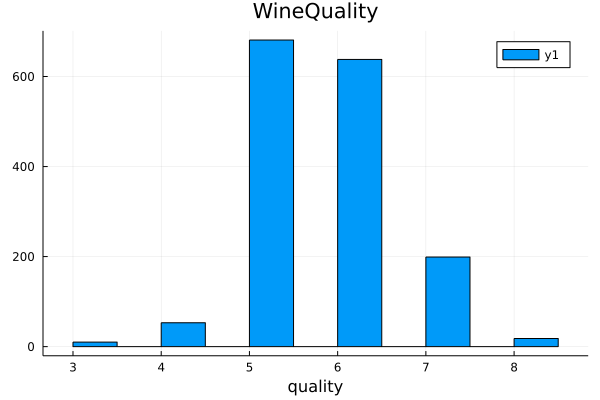

In [7]:
h = Plots.histogram(data[!, :quality], bins = 20, xlabel = "quality", title = "WineQuality")

### The distribution of the histogrm very likely symmetric. As the score represent the quality of the wine, there are not so many higher or lower quality of wine. The quality between (5-6) scales are the majority

## (b)  Association 

- Rename the Columns

In [8]:
rename!(data, Dict(
 :"fixed acidity" => :"fixed_acidity",
 :"volatile acidity" => :"volatile_acidity",
 :"citric acid" => :"citric_acid",
 :"free sulfur dioxide" => :"free_sulfur_dioxide",
 :"total sulfur dioxide" => :"total_sulfur_dioxide",
 :"residual sugar" => :"residual_sugar"));

In [9]:
println("fixed_acidity & quality Correlation: ", Statistics.cor(data.fixed_acidity, data.quality))
println("volatile_acidity & quality Correlation: ", Statistics.cor(data.volatile_acidity, data.quality))
println("citric_acid & quality Correlation: ", Statistics.cor(data.citric_acid, data.quality))
println("free_sulfur_dioxide & quality Correlation: ", Statistics.cor(data.free_sulfur_dioxide, data.quality))
println("total_sulfur_dioxide & quality Correlation: ", Statistics.cor(data.total_sulfur_dioxide, data.quality))
println("residual_sugar & quality Correlation: ", Statistics.cor(data.residual_sugar, data.quality))
println("chlorides & quality Correlation: ", Statistics.cor(data.chlorides, data.quality))
println("density & quality Correlation: ", Statistics.cor(data.density, data.quality))
println("pH & quality Correlation: ", Statistics.cor(data.pH, data.quality))
println("sulphates & quality Correlation: ", Statistics.cor(data.sulphates, data.quality))
println("alcohol & quality Correlation: ", Statistics.cor(data.alcohol, data.quality))

fixed_acidity & quality Correlation: 0.12405164911322426
volatile_acidity & quality Correlation: -0.39055778026400706
citric_acid & quality Correlation: 0.2263725143180413
free_sulfur_dioxide & quality Correlation: -0.050656057244276305
total_sulfur_dioxide & quality Correlation: -0.1851002889265378
residual_sugar & quality Correlation: 0.013731637340066261
chlorides & quality Correlation: -0.12890655993005268
density & quality Correlation: -0.1749192277833487
pH & quality Correlation: -0.05773139120538212
sulphates & quality Correlation: 0.25139707906926145
alcohol & quality Correlation: 0.4761663240011358


In [10]:
p1 = scatter(data[!,:alcohol], data[!,:quality], title = "alcohol VS quality");
p2 = scatter(data[!,:sulphates], data[!,:quality], title = "sulphates VS quality");
p3 = scatter(data[!,:pH], data[!,:quality], title = "pH VS quality");
p4 = scatter(data[!,:density], data[!,:quality], title = "density VS quality");
p5 = scatter(data[!,:chlorides], data[!,:quality], title = "chlorides VS quality");
p6 = scatter(data[!,:fixed_acidity], data[!,:quality], title = "fixed_acidity VS quality");
p7 = scatter(data[!,:volatile_acidity], data[!,:quality], title = "volatile_acidity VS quality");
p8 = scatter(data[!,:citric_acid], data[!,:quality], title = "citric_acid VS quality");
p9 = scatter(data[!,:free_sulfur_dioxide], data[!,:quality], title = "free_sulfur_dioxide VS quality");
p10 = scatter(data[!,:total_sulfur_dioxide], data[!,:quality], title = "total_sulfur_dioxide VS quality");
p11 = scatter(data[!,:residual_sugar], data[!,:quality], title = "residual_sugar VS quality");

Plots.plot(p1, p2, p3, p4, p5, p6, p7, p8, p9, p10, p11, layout = 11, legend = false)
plot!(size=(1000, 1000))


### Most of the predictors variables has comparetively weak association with the response variable (quality). sulphates, citric_acid & alcohol seems to be more associated with the dependent variable. None of the relation showed the very strong linear relationship

## (c) Simple Linear Regression

In [11]:
m1 = @formula(quality~sulphates)

FormulaTerm
Response:
  quality(unknown)
Predictors:
  sulphates(unknown)

In [12]:
model1 = lm(m1, data)

StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, LinearAlgebra.CholeskyPivoted{Float64, Matrix{Float64}}}}, Matrix{Float64}}

quality ~ 1 + sulphates

Coefficients:
───────────────────────────────────────────────────────────────────────
               Coef.  Std. Error      t  Pr(>|t|)  Lower 95%  Upper 95%
───────────────────────────────────────────────────────────────────────
(Intercept)  4.84775   0.0784197  61.82    <1e-99   4.69393     5.00157
sulphates    1.19771   0.115389   10.38    <1e-23   0.971383    1.42404
───────────────────────────────────────────────────────────────────────

### The variable is significant, the t-Statistics value is greater than 2 & p value is also so small. So we can reject the H0 (Hypothesis) & say beta value is not zero(0). Thus there might be a association with Sulphate variable with quality.

## (d) Multiple Linear Regression

In [13]:
m2 = @formula(quality~fixed_acidity+volatile_acidity+citric_acid+free_sulfur_dioxide+total_sulfur_dioxide+residual_sugar+chlorides+density+pH+sulphates+alcohol)

FormulaTerm
Response:
  quality(unknown)
Predictors:
  fixed_acidity(unknown)
  volatile_acidity(unknown)
  citric_acid(unknown)
  free_sulfur_dioxide(unknown)
  total_sulfur_dioxide(unknown)
  residual_sugar(unknown)
  chlorides(unknown)
  density(unknown)
  pH(unknown)
  sulphates(unknown)
  alcohol(unknown)

In [14]:
model2 = lm(m2, data)

StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, LinearAlgebra.CholeskyPivoted{Float64, Matrix{Float64}}}}, Matrix{Float64}}

quality ~ 1 + fixed_acidity + volatile_acidity + citric_acid + free_sulfur_dioxide + total_sulfur_dioxide + residual_sugar + chlorides + density + pH + sulphates + alcohol

Coefficients:
─────────────────────────────────────────────────────────────────────────────────────────────
                             Coef.    Std. Error      t  Pr(>|t|)      Lower 95%    Upper 95%
─────────────────────────────────────────────────────────────────────────────────────────────
(Intercept)            21.9652      21.1946        1.04    0.3002  -19.6071       63.5375
fixed_acidity           0.0249906    0.0259485     0.96    0.3357   -0.0259064     0.0758875
volatile_acidity       -1.08359      0.121101     -8.95    <1e-18   -1.32113      -0.846055
citric_acid            -0.182564     0.147176     -1.24    0.2150   -0.471244 

In [15]:
regtable(model2)


--------------------------------
                        quality 
                       ---------
                             (1)
--------------------------------
(Intercept)               21.965
                        (21.195)
fixed_acidity              0.025
                         (0.026)
volatile_acidity       -1.084***
                         (0.121)
citric_acid               -0.183
                         (0.147)
free_sulfur_dioxide       0.004*
                         (0.002)
total_sulfur_dioxide   -0.003***
                         (0.001)
residual_sugar             0.016
                         (0.015)
chlorides              -1.874***
                         (0.419)
density                  -17.881
                        (21.633)
pH                       -0.414*
                         (0.192)
sulphates               0.916***
                         (0.114)
alcohol                 0.276***
                         (0.026)
--------------------------------
Estimator

### Regression Assumptions

In [16]:
# predicted values
pred1 = predict(model2)
# residuals
red1 = data[!, :quality] - pred1;

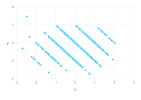

In [17]:
# homoscedasticity Assumption 
Gadfly.plot(x=red1,y=pred1, Geom.point)

### Here the variance is not same in different X value, so homoscedasticity assumption is not totally OK

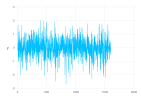

In [18]:
# Independence Assumption
Gadfly.plot(y=red1, Geom.line)

### All the observations look random, So the independent assumption hold

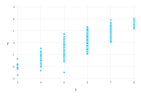

In [19]:
# Exogeneity assumption
Gadfly.plot(x = data[!, :quality], y=red1)

### We observed some pattern over the plot, so the Epsilon captured some information . It  might violate the assumption mildly.

### Coefficient Significance

In [53]:
coef(model1)

2-element Vector{Float64}:
 4.847749534389229
 1.197712323031245

In [54]:
stderror(model1)

2-element Vector{Float64}:
 0.0784196995981123
 0.11538866788152756

In [55]:
vcov(model1)

2×2 Matrix{Float64}:
  0.00614965  -0.00876295
 -0.00876295   0.0133145

### The potential remedy for fixing the regression would be adding or filtering the predictors. Doing different types of transformation and iteratively observe the result. If it is not improved a lot, the Box-Cox transformation would be applied and checking the Coefficient Significance. For assure the predictive ability of the developed method, the R2 (R-square) value would be checked.

### (e) Box-Cox Transformation

In [20]:
BoxCoxTrans.lambda(data.quality)

(value = 0.6199201096914126, details = Results of Optimization Algorithm
 * Algorithm: Brent's Method
 * Search Interval: [-2.000000, 2.000000]
 * Minimizer: 6.199201e-01
 * Minimum: 1.298245e+03
 * Iterations: 9
 * Convergence: max(|x - x_upper|, |x - x_lower|) <= 2*(1.5e-08*|x|+2.2e-16): true
 * Objective Function Calls: 10)

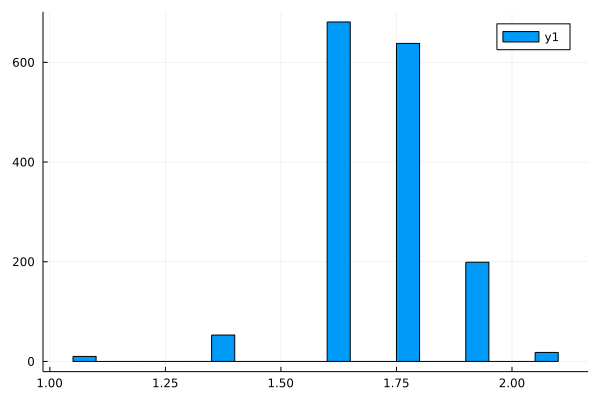

In [52]:
# for lambda=0

histogram(BoxCoxTrans.transform(data.quality, 0.0))

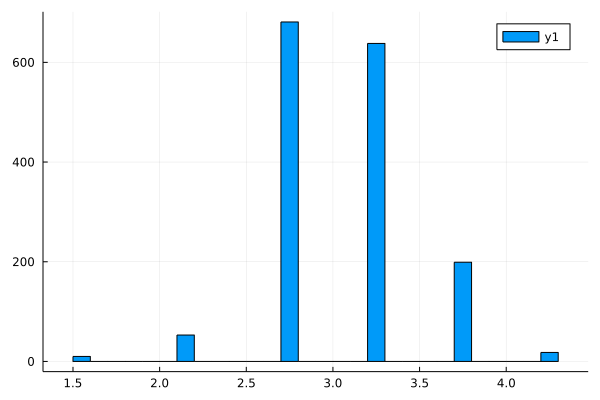

In [21]:
histogram(BoxCoxTrans.transform(data.quality))

### optimal transformation

In [22]:
# optimal transformed 
BoxCoxTrans.lambda(data.quality).value

0.6199201096914126

In [23]:
dt = copy(data)
data[!, :bquality] = BoxCoxTrans.transform(data.quality);

In [24]:
m_bx = @formula(bquality~fixed_acidity+volatile_acidity+citric_acid+free_sulfur_dioxide+total_sulfur_dioxide+residual_sugar+chlorides+density+pH+sulphates+alcohol)

FormulaTerm
Response:
  bquality(unknown)
Predictors:
  fixed_acidity(unknown)
  volatile_acidity(unknown)
  citric_acid(unknown)
  free_sulfur_dioxide(unknown)
  total_sulfur_dioxide(unknown)
  residual_sugar(unknown)
  chlorides(unknown)
  density(unknown)
  pH(unknown)
  sulphates(unknown)
  alcohol(unknown)

In [25]:
model_bx = lm(m_bx, data)

StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, LinearAlgebra.CholeskyPivoted{Float64, Matrix{Float64}}}}, Matrix{Float64}}

bquality ~ 1 + fixed_acidity + volatile_acidity + citric_acid + free_sulfur_dioxide + total_sulfur_dioxide + residual_sugar + chlorides + density + pH + sulphates + alcohol

Coefficients:
───────────────────────────────────────────────────────────────────────────────────────────
                            Coef.   Std. Error      t  Pr(>|t|)     Lower 95%     Upper 95%
───────────────────────────────────────────────────────────────────────────────────────────
(Intercept)            9.10412     11.0486       0.82    0.4101  -12.5672      30.7754
fixed_acidity          0.010735     0.0135267    0.79    0.4275   -0.0157972    0.0372672
volatile_acidity      -0.582253     0.0631291   -9.22    <1e-19   -0.706078    -0.458427
citric_acid           -0.107001     0.0767218   -1.39    0.1633   -0.257488     0.0434858
fr

In [26]:
regtable(model2, model_bx)


--------------------------------------------
                        quality     bquality
                       ---------   ---------
                             (1)         (2)
--------------------------------------------
(Intercept)               21.965       9.104
                        (21.195)    (11.049)
fixed_acidity              0.025       0.011
                         (0.026)     (0.014)
volatile_acidity       -1.084***   -0.582***
                         (0.121)     (0.063)
citric_acid               -0.183      -0.107
                         (0.147)     (0.077)
free_sulfur_dioxide       0.004*      0.002*
                         (0.002)     (0.001)
total_sulfur_dioxide   -0.003***   -0.002***
                         (0.001)     (0.000)
residual_sugar             0.016       0.007
                         (0.015)     (0.008)
chlorides              -1.874***   -0.970***
                         (0.419)     (0.219)
density                  -17.881      -6.722
         

### The R2 value is not better from the previous model

In [27]:
# predicted values
pred2 = predict(model_bx)
# residuals
red2 = data[!, :quality] - pred2;


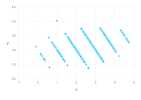

In [28]:
# homoscedasticity Assumption 
Gadfly.plot(x=red2,y=pred2, Geom.point)


### There is some improvement in homoscadasticity after performing Box-Cox Transformation, but not totally solved

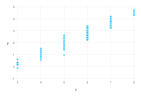

In [29]:
# Exogeneity assumption
Gadfly.plot(x = data[!, :quality], y=red2)

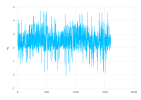

In [30]:
# Independence Assumption
Gadfly.plot(y=red2, Geom.line)

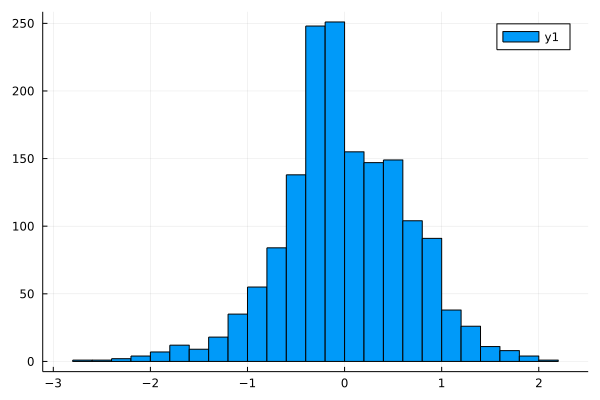

In [31]:
histogram(residuals(model2))

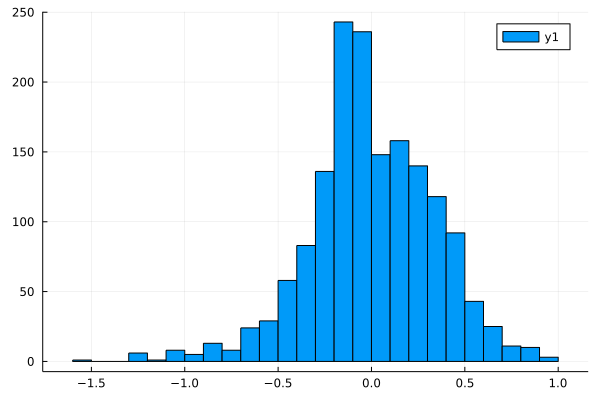

In [32]:
histogram(residuals(model_bx))

## (f) Alternating Conditional Expectation (ACE)

In [33]:
using RCall
@rput dt
R"str(dt)"

'data.frame':	1599 obs. of  12 variables:
 $ fixed_acidity       : num  7.4 7.8 7.8 11.2 7.4 7.4 7.9 7.3 7.8 7.5 ...
 $ volatile_acidity    : num  0.7 0.88 0.76 0.28 0.7 0.66 0.6 0.65 0.58 0.5 ...
 $ citric_acid         : num  0 0 0.04 0.56 0 0 0.06 0 0.02 0.36 ...
 $ residual_sugar      : num  1.9 2.6 2.3 1.9 1.9 1.8 1.6 1.2 2 6.1 ...
 $ chlorides           : num  0.076 0.098 0.092 0.075 0.076 0.075 0.069 0.065 0.073 0.071 ...
 $ free_sulfur_dioxide : num  11 25 15 17 11 13 15 15 9 17 ...
 $ total_sulfur_dioxide: num  34 67 54 60 34 40 59 21 18 102 ...
 $ density             : num  0.998 0.997 0.997 0.998 0.998 ...
 $ pH                  : num  3.51 3.2 3.26 3.16 3.51 3.51 3.3 3.39 3.36 3.35 ...
 $ sulphates           : num  0.56 0.68 0.65 0.58 0.56 0.56 0.46 0.47 0.57 0.8 ...
 $ alcohol             : num  9.4 9.8 9.8 9.8 9.4 9.4 9.4 10 9.5 10.5 ...
 $ quality             : int  5 5 5 6 5 5 5 7 7 5 ...


RObject{NilSxp}
NULL


In [34]:
R"library(acepack)"

RObject{StrSxp}
[1] "acepack"   "stats"     "graphics"  "grDevices" "utils"     "datasets" 
[7] "methods"   "base"     


In [35]:
R"x <- dt"
R"y <- unlist(dt[, 12])"
R"amod <- ace(x,y)"

RObject{VecSxp}
$p
[1] 12

$n
[1] 1599

$x
                           1       2      3      4       5       6       7
fixed_acidity         7.4000  7.8000  7.800 11.200  7.4000  7.4000  7.9000
volatile_acidity      0.7000  0.8800  0.760  0.280  0.7000  0.6600  0.6000
citric_acid           0.0000  0.0000  0.040  0.560  0.0000  0.0000  0.0600
residual_sugar        1.9000  2.6000  2.300  1.900  1.9000  1.8000  1.6000
chlorides             0.0760  0.0980  0.092  0.075  0.0760  0.0750  0.0690
free_sulfur_dioxide  11.0000 25.0000 15.000 17.000 11.0000 13.0000 15.0000
total_sulfur_dioxide 34.0000 67.0000 54.000 60.000 34.0000 40.0000 59.0000
density               0.9978  0.9968  0.997  0.998  0.9978  0.9978  0.9964
pH                    3.5100  3.2000  3.260  3.160  3.5100  3.5100  3.3000
sulphates             0.5600  0.6800  0.650  0.580  0.5600  0.5600  0.4600
alcohol               9.4000  9.8000  9.800  9.800  9.4000  9.4000  9.4000
quality               5.0000  5.0000  5.000  6.000  5.000

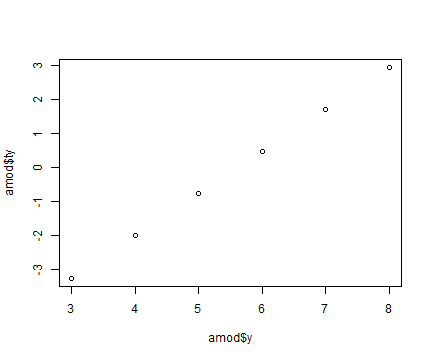

RObject{NilSxp}
NULL


In [36]:
# Plots
# View the response transformation

R"plot(amod$y, amod$ty)"

In [37]:
@rget amod

OrderedCollections.OrderedDict{Symbol, Any} with 14 entries:
  :p      => 12
  :n      => 1599
  :x      => [7.4 7.8 … 5.9 6.0; 0.7 0.88 … 0.645 0.31; … ; 9.4 9.8 … 10.2 11.0…
  :y      => [5.0, 5.0, 5.0, 6.0, 5.0, 5.0, 5.0, 7.0, 7.0, 5.0  …  5.0, 6.0, 6.…
  :w      => [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0  …  1.0, 1.0, 1.…
  :l      => [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
  :delrsq => 0.01
  :ns     => 1
  :tx     => [5.26066e-7 6.7667e-7 … 2.19415e-7 -0.787823; 3.33954e-7 9.81054e-…
  :ty     => [-0.787823, -0.787823, -0.787823, 0.450848, -0.787823, -0.787823, …
  :rsq    => 1.0
  :ierr   => 0
  :m      => [46, 96, 822, 1271, 1322, 554, 589, 95, 1115, 1229  …  496, 499, 1…
  :z      => [-3.26516 -0.787823 … 5.94133e-7 0.497619; -3.26516 -0.787822 … 5.…

### R2 value

In [38]:
amod[:rsq]

0.9999999999996084

#### There observed the improvement of the R2 value

###  Checking  the Transformations

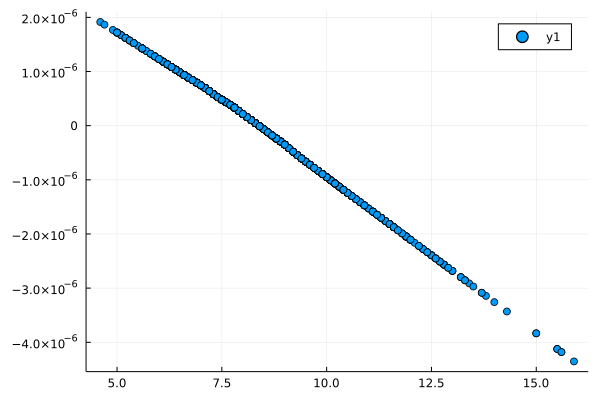

In [39]:
# fixed_acidity

scatter(amod[:x][1,:], amod[:tx][:,1])

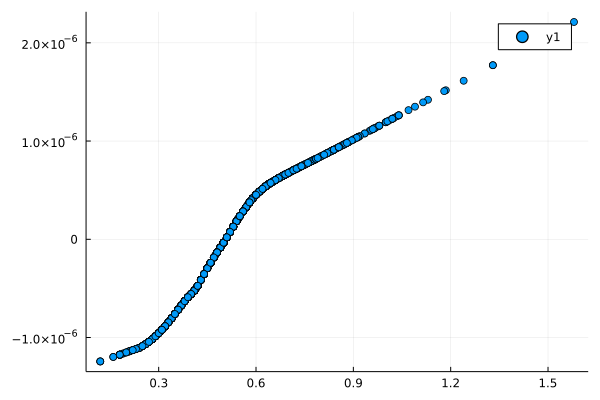

In [40]:
# volatile_acidity

scatter(amod[:x][2,:], amod[:tx][:,2])

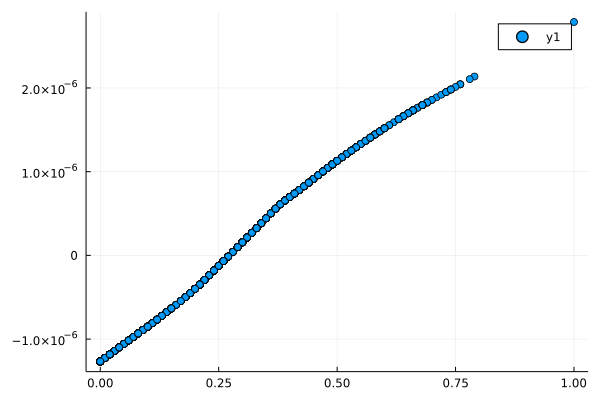

In [41]:
# citric_acid 
scatter(amod[:x][3,:], amod[:tx][:,3])

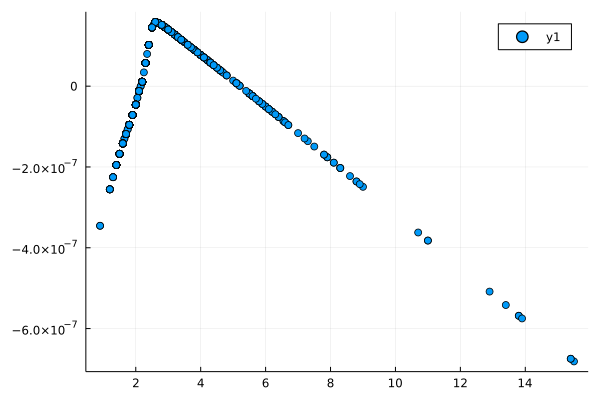

In [42]:
# residual_sugar
scatter(amod[:x][4,:], amod[:tx][:,4])

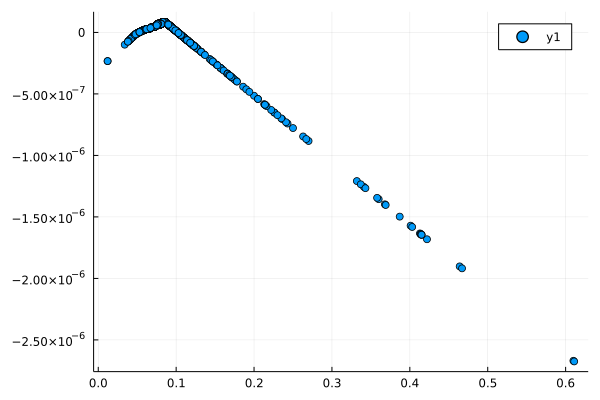

In [43]:
# chlorides 

scatter(amod[:x][5,:], amod[:tx][:,5])

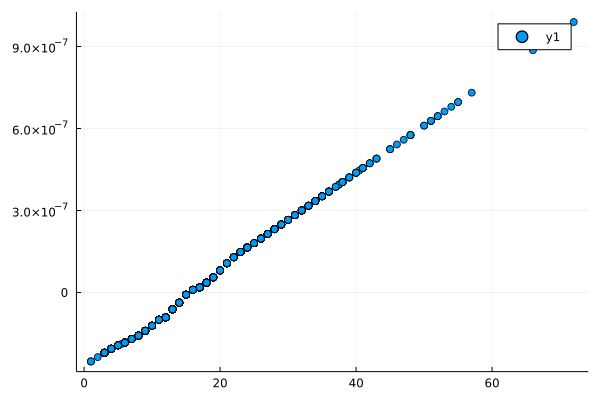

In [44]:
# free_sulfur_dioxide 

scatter(amod[:x][6,:], amod[:tx][:,6])

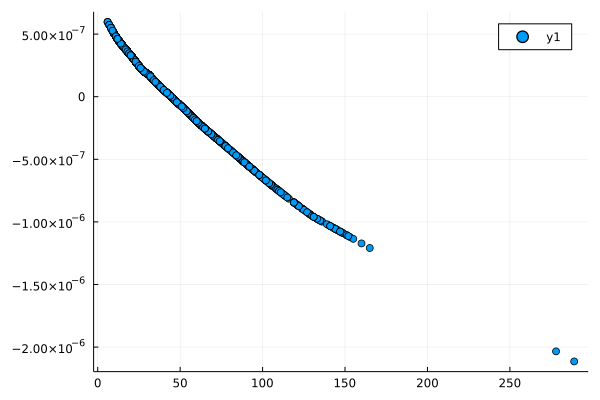

In [45]:
# total_sulfur_dioxide

scatter(amod[:x][7,:], amod[:tx][:,7])

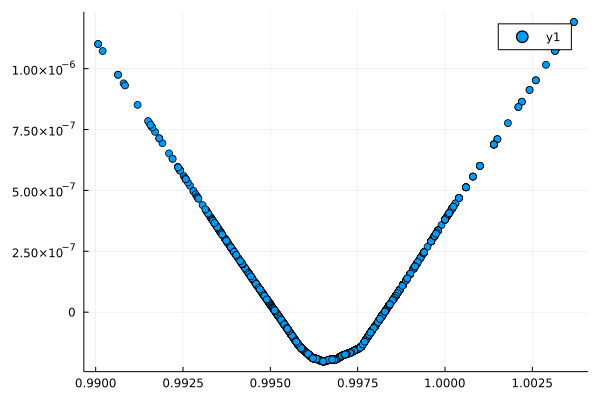

In [46]:
# density

scatter(amod[:x][8,:], amod[:tx][:,8])

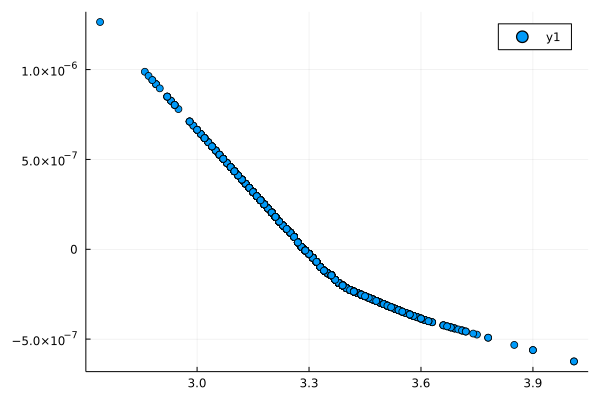

In [47]:
# PH

scatter(amod[:x][9,:], amod[:tx][:,9])

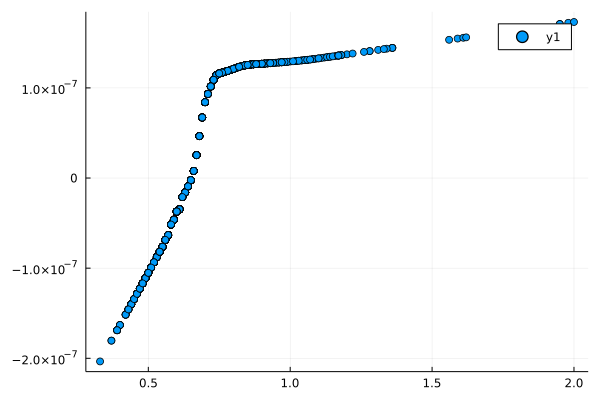

In [48]:
#  sulphates

scatter(amod[:x][10,:], amod[:tx][:,10])

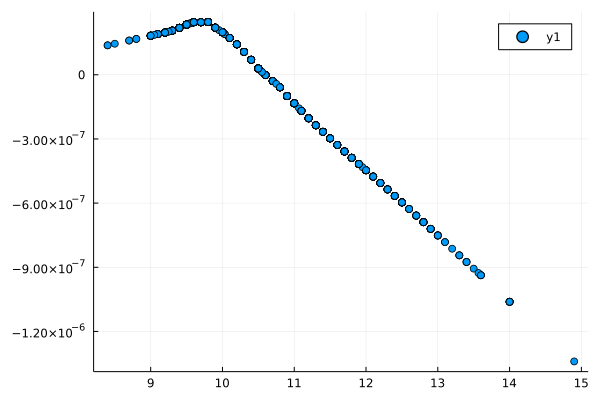

In [49]:
# alcohol 

scatter(amod[:x][11,:], amod[:tx][:,11])

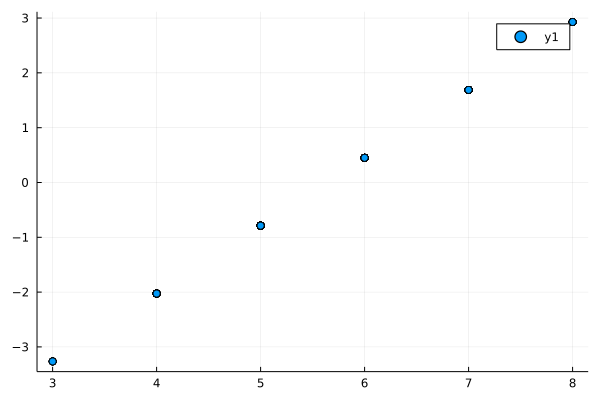

In [50]:
# quality

scatter(amod[:x][12,:], amod[:tx][:,12])